# Clustering Based Article Recommendation System


In this notebook, we will build a clustering-based article recommender system. The system will group similar articles together and recommend articles from the same cluster to users based on their reading history. Clustering helps in identifying distinct groups in our dataset, which can then be used to make meaningful recommendations.


In [1]:
import numpy as np                                                      
import pandas as pd                                                    
import matplotlib.pyplot as plt                                        
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm
from nltk.corpus import stopwords
import re
import string
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from tqdm import tqdm
from nltk.tokenize import sent_tokenize
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import euclidean_distances
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

In [2]:
df = pd.read_csv('shared_articles.csv')

In [3]:
df.head(5)

,timestamp,eventType,contentId,authorPersonId,authorSessionId,authorUserAgent,authorRegion,authorCountry,contentType,url,title,text,lang
0,1459192779,CONTENT REMOVED,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
1,1459193988,CONTENT SHARED,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,1459194146,CONTENT SHARED,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,1459194474,CONTENT SHARED,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,1459194497,CONTENT SHARED,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en


In [4]:
df.isna().sum()

timestamp             0
eventType             0
contentId             0
authorPersonId        0
authorSessionId       0
authorUserAgent    2442
authorRegion       2442
authorCountry      2442
contentType           0
url                   0
title                 0
text                  0
lang                  0
dtype: int64

In [5]:
set(df['lang'])

{'en', 'es', 'ja', 'la', 'pt'}

In [6]:
# Limiting our recommendation to English Articles
df_main = df[df['lang']=='en']

In [7]:
set(df_main['lang'])

{'en'}

## Cleaning

In [8]:
# https://stackoverflow.com/a/47091490/4084039
def decontracted(phrase):
    """
    This function would convert some short letters into the forms that one 
    could easily understand respectively.
    """
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [9]:
def text_preprocessing(df, feature, stemming = False, lemmatize = True):
    pattern = "[^a-zA-Z0-9]"
    english_stopwords = stopwords.words("english")
    preprocessed_text = []
    for i in tqdm(range(len(df[feature]))):
        text = decontracted(df[feature].iloc[i])
        text = re.sub(pattern, ' ', text)
        text = text.lower()
        text = word_tokenize(text)
        text = [word for word in text if word not in english_stopwords]
        text = [word for word in text if word not in string.punctuation]
        if stemming:
            porter_stemmer = PorterStemmer()
            text = " ".join([porter_stemmer.stem(word) for word in text])
        if lemmatize:
            lemmatizer = WordNetLemmatizer()
            text = " ".join([lemmatizer.lemmatize(word) for word in text])
        preprocessed_text.append(text)
    
    return preprocessed_text

In [10]:
preprocessed_text = text_preprocessing(df_main, feature = "text")

100%|██████████████████████████████████████| 2264/2264 [00:09<00:00, 228.66it/s]


In [11]:
len(preprocessed_text)

2264

In [12]:
preprocessed_title = text_preprocessing(df_main, feature = "title")

100%|████████████████████████████████████| 2264/2264 [00:00<00:00, 12019.28it/s]


In [13]:
len(preprocessed_title)

2264

# Recommendation based on just the Items - Articles
##### At an overall level
##### Assuming no User Information is available
Generating the recommendations based on similarity of items- Clustering like problem

In [14]:
# All the columns are unimportant but text/ title
df_main.columns

Index(['timestamp', 'eventType', 'contentId', 'authorPersonId',
       'authorSessionId', 'authorUserAgent', 'authorRegion', 'authorCountry',
       'contentType', 'url', 'title', 'text', 'lang'],
      dtype='object')

TF-IDF
* TF(t) = (Number of times term 't' appears in a document) / (Total number of terms in the document)
* IDF(t) = log_e(Total number of documents / Number of documents with term 't' in it)

In [15]:
vectorizer_text = TfidfVectorizer(stop_words='english')
vectorizer_title = TfidfVectorizer(stop_words='english')

In [16]:
tfidf_vectorizer_text = vectorizer_text.fit_transform(preprocessed_text)

In [17]:
tfidf_vectorizer_title = vectorizer_title.fit_transform(preprocessed_title)

* Inertia actually calculates the sum of distances of all the points within a cluster from the centroid of that cluster
* Along with the distance between the centroid and points, the Dunn index also takes into account the distance between two clusters

### Clustering for "Text"

In [18]:
# sum of the squared Euclidean distances of each point to its closest centroid
sse = {}

for i in range(2,40):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=100,random_state=18).fit(tfidf_vectorizer_text)
    sse[i] = kmeans.inertia_

Text(0.5, 1.0, 'Elbow Plot for K-means - Clustering based on Text of the articles')

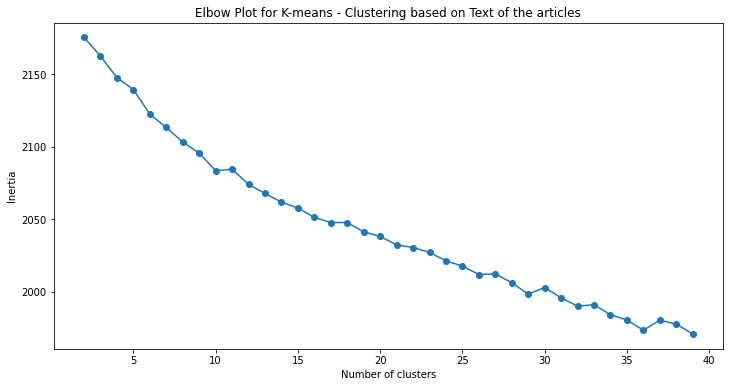

In [19]:
# Plotting the curve with 'k'-value vs distance
plt.figure(figsize=(12,6))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot for K-means - Clustering based on Text of the articles")

In [20]:
# Use silhouette score to find optimal number of clusters

res = {}
for i in range(2,40):
    
    model = KMeans(n_clusters = i,random_state=18).fit(tfidf_vectorizer_text)
    pred = model.predict(tfidf_vectorizer_text)
    res[i] = silhouette_score(tfidf_vectorizer_text, pred)


In [21]:
optimum = max(res, key=res.get)
print(optimum)
res

39


{2: 0.003055912094839273,
 3: 0.004131543992817762,
 4: 0.007417282677777405,
 5: 0.009590430252896147,
 6: 0.008979213221592874,
 7: 0.01062656372141711,
 8: 0.011815372649432162,
 9: 0.013286830983116173,
 10: 0.01514067799648782,
 11: 0.013658473447748804,
 12: 0.01559358790911475,
 13: 0.01674460931337574,
 14: 0.018110736705499376,
 15: 0.0187835805973069,
 16: 0.01836659455226315,
 17: 0.019468994748025666,
 18: 0.016337384888959933,
 19: 0.019834825826292573,
 20: 0.01940126553149779,
 21: 0.019695724729159987,
 22: 0.018868771447536476,
 23: 0.021773143536228078,
 24: 0.022709788310159955,
 25: 0.023231621470240646,
 26: 0.021437216224454082,
 27: 0.02058472832817315,
 28: 0.02096593528501387,
 29: 0.024344698798235996,
 30: 0.02476608684910881,
 31: 0.027167631917958165,
 32: 0.02542823098299853,
 33: 0.02610758844075716,
 34: 0.026285878102768993,
 35: 0.027547251489997152,
 36: 0.0278769167393766,
 37: 0.02371454224456727,
 38: 0.025299794860803967,
 39: 0.027973147563572272

Very low sillhouette scores.

The coefficient combines the average within-cluster distance with the average nearest-cluster distance to assign a value between -1 and 1. A value below zero indicates that the observation is likely misplaced in the wrong cluster, while a value closer to 1 suggests that the observation is a strong fit for the cluster and is distinctly separated from other clusters.

This metric is instrumental in evaluating the effectiveness of our clustering algorithm. A high coefficient value implies that the clusters are well-defined and the data points within each cluster are similar to each other while being dissimilar to points in other clusters. Conversely, a low or negative value indicates poor clustering, where points might be incorrectly grouped.

For a more detailed explanation, you can refer to the following source:

__Reference__: [Jeremy Jordan - Grouping Data Points with K-Means Clustering](https://www.jeremyjordan.me/grouping-data-points-with-k-means-clustering/)



In [22]:
best_k = optimum

In [23]:
# model with k different centroid initializations and maximum iterations of 500
k_model_text = KMeans(n_clusters=best_k, init='k-means++', max_iter=500, n_init=best_k,random_state=18)

In [24]:
k_model_text.fit(tfidf_vectorizer_text)

KMeans(max_iter=500, n_clusters=39, n_init=39, random_state=18)

In [25]:
df_main["clusters_text"] = k_model_text.labels_

/var/folders/3c/q875p1_979j40ck65t4g0y640000gn/T/ipykernel_9072/2268848423.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_main["clusters_text"] = k_model_text.labels_


In [26]:
from wordcloud import WordCloud

/Users/sriharikacherukuri/Library/Python/3.8/lib/python/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


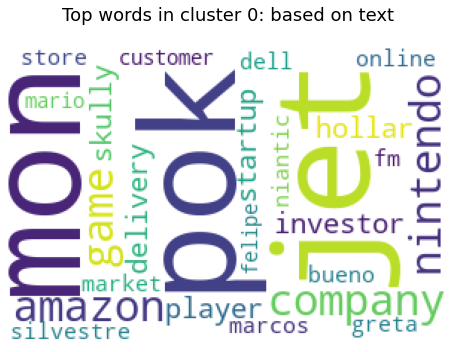

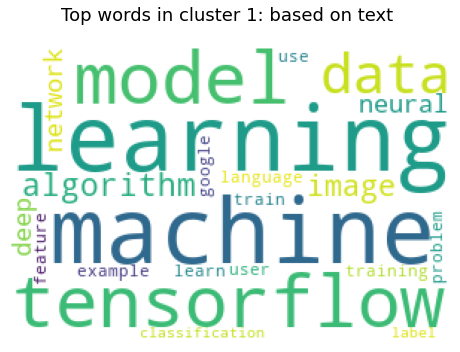

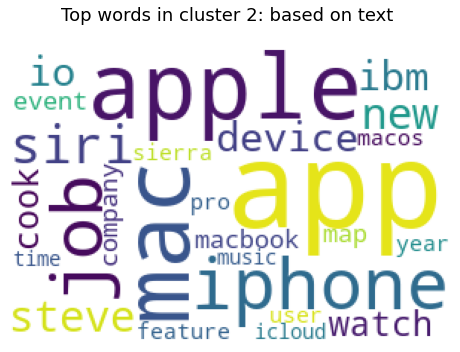

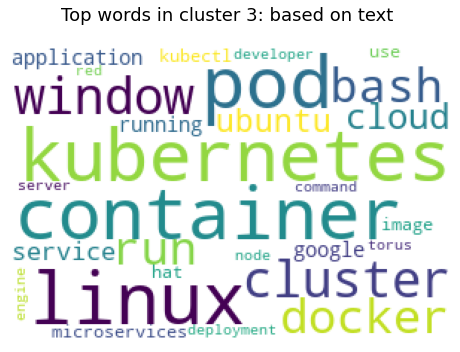

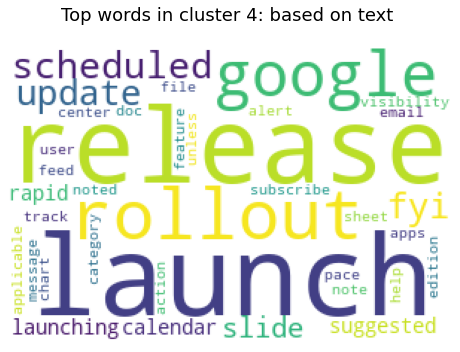

...

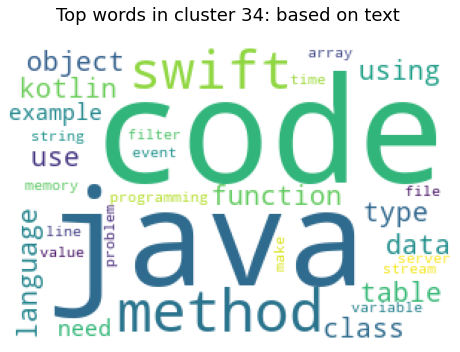

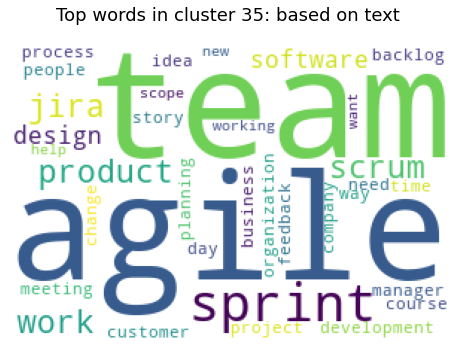

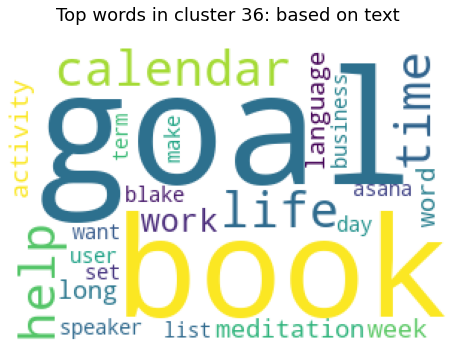

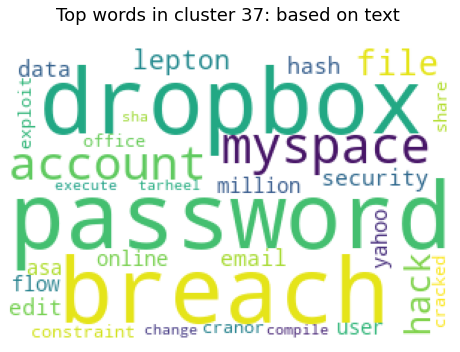

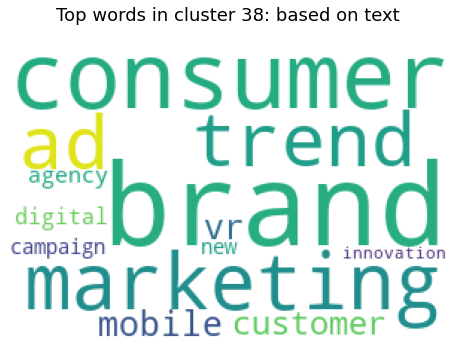

In [27]:
# Previewing top k words in each cluster

# print("Top words in each cluster:")
order_centroids = k_model_text.cluster_centers_.argsort()[:, ::-1]
words = vectorizer_text.get_feature_names()


for i in range(best_k):
    cloud = []
#     print("Cluster %d:" % i),
    for ind in order_centroids[i, :best_k]:
#         print(' %s' % words[ind]),
        cloud.append(words[ind])
        
    wordcloud = WordCloud(width = 300, height = 200, 
            background_color ='white', 
            min_font_size = 10).generate(' '.join(cloud))

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 6)) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title('Top words in cluster '+ str(i)+': based on text \n',fontsize=18)
    plt.show()     

### Clustering for "Title"

In [28]:
# sum of the squared Euclidean distances of each point to its closest centroid
sse = {}
for i in range(2,40):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=100,random_state=18).fit(tfidf_vectorizer_title)
    sse[i] = kmeans.inertia_

Text(0.5, 1.0, 'Elbow Plot for K-means - Clustering based on Text of the articles')

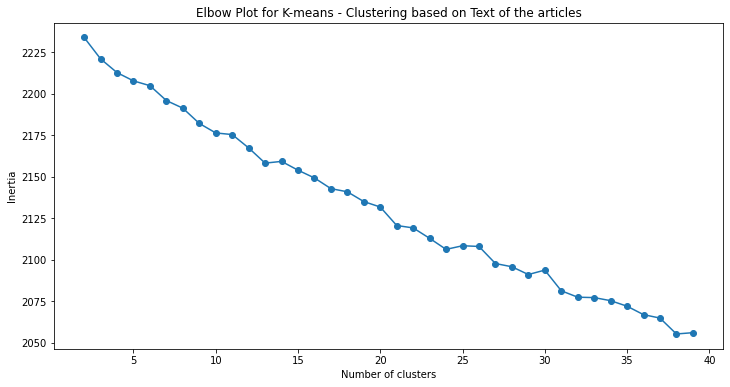

In [29]:
# Plotting the curve with 'k'-value vs distance
plt.figure(figsize=(12,6))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Plot for K-means - Clustering based on Text of the articles")

In [30]:
# Use silhouette score to find optimal number of clusters

res = {}
for i in range(2,40):
    
    model = KMeans(n_clusters = i,random_state=18).fit(tfidf_vectorizer_title)
    pred = model.predict(tfidf_vectorizer_title)
    res[i] = silhouette_score(tfidf_vectorizer_title, pred)


In [31]:
optimum = max(res, key=res.get)
print(optimum)
res

38


{2: 0.004035454683086252,
 3: 0.0057530845057084095,
 4: 0.00647692387426131,
 5: 0.007445692473801683,
 6: 0.007089101008432353,
 7: 0.008874212474876566,
 8: 0.00792634966595526,
 9: 0.01073922370625746,
 10: 0.011420359808516963,
 11: 0.0098430819988639,
 12: 0.011438470827286381,
 13: 0.014274237178940625,
 14: 0.014414813653431143,
 15: 0.013183859306487767,
 16: 0.013746188459118678,
 17: 0.014843212483213497,
 18: 0.01471237419420189,
 19: 0.016196913867657366,
 20: 0.015492008316225868,
 21: 0.017697094298152312,
 22: 0.017452188606221056,
 23: 0.018394452660890022,
 24: 0.0207267392440533,
 25: 0.01844626465645334,
 26: 0.018640638631061385,
 27: 0.020412976432043824,
 28: 0.019669545399344106,
 29: 0.019539139580021868,
 30: 0.01879196137706378,
 31: 0.021765992884846937,
 32: 0.021837645095191257,
 33: 0.02287750253472014,
 34: 0.02153681880565058,
 35: 0.022236770719988953,
 36: 0.023129077689356067,
 37: 0.02362517638967728,
 38: 0.026159175147515906,
 39: 0.02423964566655

In [32]:
best_k = optimum

In [33]:
# model with k different centroid initializations and maximum iterations of 500
k_model_title = KMeans(n_clusters=best_k, init='k-means++', max_iter=500, n_init=best_k,random_state=18)

In [34]:
k_model_title.fit(tfidf_vectorizer_title)

KMeans(max_iter=500, n_clusters=38, n_init=38, random_state=18)

In [35]:
df_main["clusters_title"] = k_model_title.labels_

/var/folders/3c/q875p1_979j40ck65t4g0y640000gn/T/ipykernel_9072/3967745156.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_main["clusters_title"] = k_model_title.labels_


/Users/sriharikacherukuri/Library/Python/3.8/lib/python/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


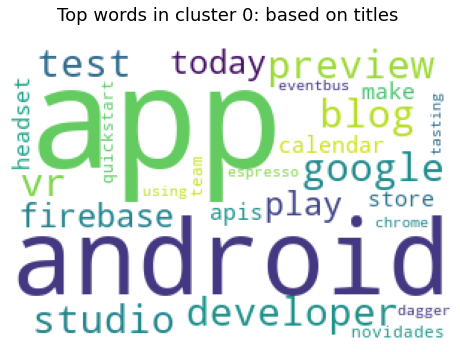

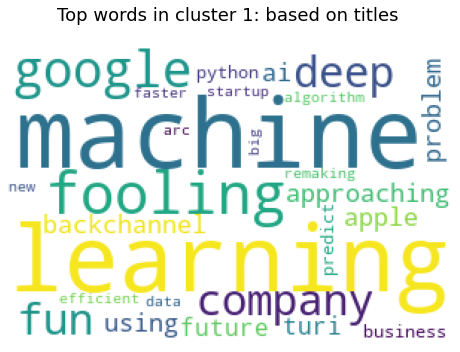

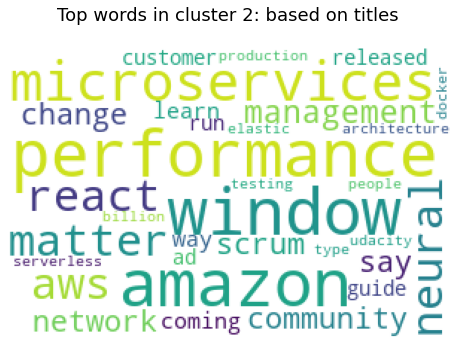

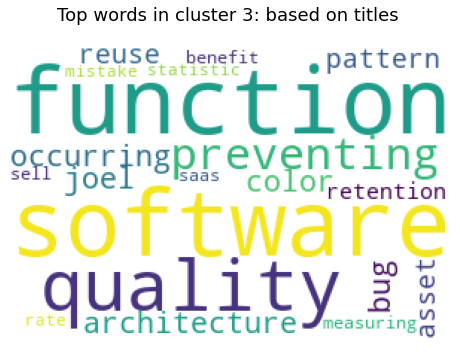

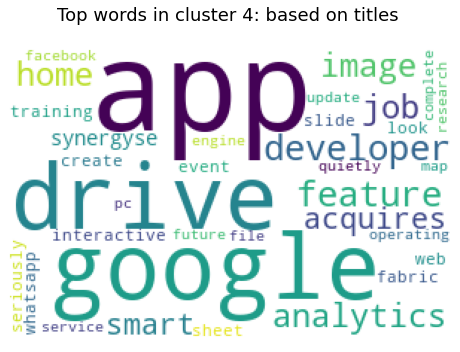

...

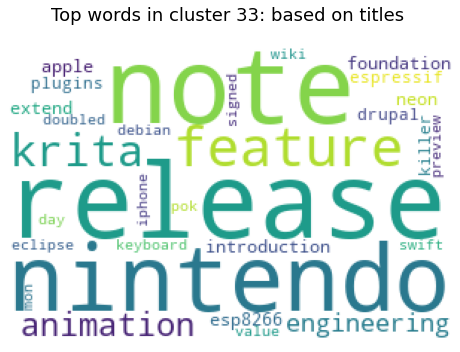

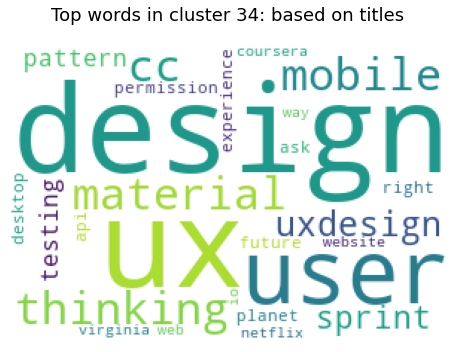

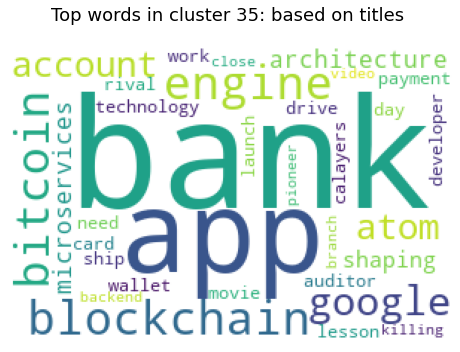

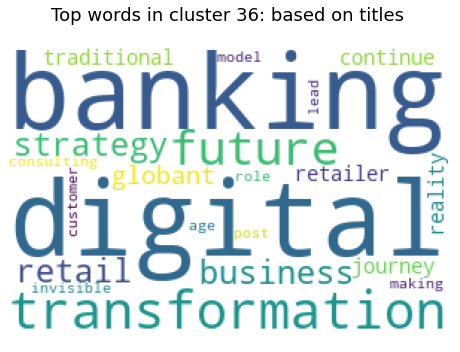

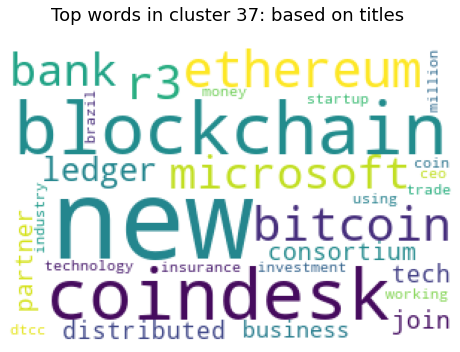

In [36]:
# Previewing top k words in each cluster

# print("Top words in each cluster:")
order_centroids = k_model_title.cluster_centers_.argsort()[:, ::-1]
words = vectorizer_title.get_feature_names()


for i in range(best_k):
    cloud = []
#     print("Cluster %d:" % i),
    for ind in order_centroids[i, :best_k]:
#         print(' %s' % words[ind]),
        cloud.append(words[ind])
        
    wordcloud = WordCloud(width = 300, height = 200, 
            background_color ='white', 
            min_font_size = 10).generate(' '.join(cloud))

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 6)) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title('Top words in cluster '+ str(i)+': based on titles \n',fontsize=18)
    plt.show()     

# Recommendation System - Clustering Based

In [87]:
def cluster_predict(input_txt,text = True, title = False):
    
    if text:
        clu = vectorizer_text.transform((input_txt))
        pred = k_model_text.predict(clu)
    if title:
        clu = vectorizer_title.transform((input_txt))
        pred = k_model_title.predict(clu)
        
    return pred

In [88]:
def recommend(input_txt,text=True,title=False):

    # Predicting the cluster
    prediction = (cluster_predict(input_txt,text,title))
    
    # Based on the above prediction 10 random articles are recommended from the whole data-frame
    
    if text:
        temp = df_main[df_main['clusters_text'] == prediction[0]]
    if title:
        temp = df_main[df_main['clusters_title'] == prediction[0]]        
        
    temp = temp.sample(5)
    print('Cluster number is: ',prediction[0])
    
    return set(temp['title'])

In [96]:
# provide user-input text based
user_input = ['The robot cannot see the human arm during the entire dressing process. In particular, it cannot always see the elbow or determine its precise position or bearing. That, in turn, affects the amount of force the robot has to apply to pull the article of clothing — such as a long-sleeve shirt — from the hand to the shoulder.'] #change the input
res = recommend(user_input, True, False)

print('Recommending top 5 articles according to the user input based on text:')
res

Cluster number is:  22
Recommending top 5 articles according to the user input based on text:


{'8 Old School SEO Practices That Are No Longer Effective - Whiteboard Friday',
 'Blab shuts down, but founders promise new product on the way',
 'Google unleashes DeepMind on energy-hungry datacenter, cutting cooling bill by 40 percent',
 "Here's what Viv looks like, the next generation AI assistant built by Siri creator",
 'Virtual Weapons Are Turning Teen Gamers Into Serious Gamblers'}

In [95]:
# provide user-input title based
user_input = ['Learning to think critically about machine learning'] #change the input
res = recommend(user_input, False, True)

print('Recommending top 5 articles according to the user input based on title:')
res

Cluster number is:  1
Recommending top 5 articles according to the user input based on title:


{'Apple Acquires Machine Learning Company Turi For $200 Million',
 "Google Calendar's newest feature uses machine learning to help you actually accomplish your goals",
 'Google saves Allo conversations, a win for machine learning but a loss for privacy - Tech2',
 'Key trends in machine learning and AI',
 'Learning at the speed of business'}

In [97]:
# provide user-input title based
user_input = ['Block Chain and Crypto Currency'] #change the input
res = recommend(user_input, False, True)

print('Recommending top 5 articles according to the user input based on title:')
res

Cluster number is:  5
Recommending top 5 articles according to the user input based on title:


{'Game of Loans',
 'Hotpatching a C Function on x86',
 "Lady Gaga's startup Backplane burns out and sells assets",
 'Paragraphs',
 "The Biggest Crowdfunding Project Ever Was Supposed to Create Manager-free Companies. But It's a Mess"}